In [ ]:
# !pip install -q git+https://github.com/tensorflow/examples.git

In [1]:
import tensorflow as tf
import numpy as np

from glob import glob
from commons import load_images_from_directory_resize
from sklearn.model_selection import train_test_split
from tqdm import tqdm
from skimage.io import imread
from skimage.transform import resize
from tensorflow.keras.metrics import MeanIoU

2023-03-03 21:24:59.436503: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-03-03 21:24:59.678296: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-03-03 21:24:59.678316: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-03-03 21:25:00.552328: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-

In [2]:
from __future__ import absolute_import, division, print_function, unicode_literals
from tensorflow_examples.models.pix2pix import pix2pix
from IPython.display import clear_output
import matplotlib.pyplot as plt
from commons import plot, find_bighest_cluster
from keras import backend as K
from commons import binarize_image 
from skimage import filters, morphology
from scipy import ndimage as ndi
from skimage.color.adapt_rgb import adapt_rgb, each_channel

In [3]:
@adapt_rgb(each_channel)
def merge_image_mask(image, mask):
    return image * mask

def create_mask(pred_mask):
    
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    
    return np.asarray(pred_mask).reshape(DIM, DIM)

def smoothing_mask(mask):
    mask = find_bighest_cluster(mask)
    
    mask = morphology.closing(mask, morphology.disk(9))

    mask = ndi.binary_fill_holes(mask)

    mask = filters.gaussian(mask, sigma=0.5)

    return binarize_image(mask)

def dice_coef(y_true, y_pred, smooth=1):
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2 * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def iou_coef(y_true, y_pred, smooth=1):
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

def plot_cnn_metrics(history):
    
    plt.figure(figsize=(10, 8))
    plt.grid(True)
    

    markers = ["D", "o", "X", "*", "H", "d", "P", "p", "<", ">", "."]
    keys = history.history.keys()
    lengeds = []
    for index, key in enumerate(keys):
        
        if "loss" in key or "lr" in key: continue
        
        plt.plot(history.history[key], marker=markers[index], lw=1)
        lengeds.append(key)

    plt.legend(lengeds)

    plt.xlabel('Epochs ')
    plt.ylabel('Metric')

    plt.title("Treino")

In [4]:
DIM = 224

In [5]:
def unet_model():
    
    base_model = tf.keras.applications.MobileNetV2(input_shape=[DIM, DIM, 3], include_top=False)

    # Use as ativações dessas camadas
    layer_names = [
        'block_1_expand_relu',   # 64x64
        'block_3_expand_relu',   # 32x32
        'block_6_expand_relu',   # 16x16
        'block_13_expand_relu',  # 8x8
        'block_16_project',      # 4x4
    ]
    
    layers = [base_model.get_layer(name).output for name in layer_names]

    # Crie o modelo de extração de características
    down_stack = tf.keras.Model(inputs=base_model.input, outputs=layers)

    down_stack.trainable = False
    
    up_stack = [
        pix2pix.upsample(512, 3),  # 4x4 -> 8x8
        pix2pix.upsample(256, 3),  # 8x8 -> 16x16
        pix2pix.upsample(128, 3),  # 16x16 -> 32x32
        pix2pix.upsample(64, 3),   # 32x32 -> 64x64
    ]

    inputs = tf.keras.layers.Input(shape=[DIM, DIM, 3])
    x = inputs

    # Downsampling através do modelo
    skips = down_stack(x)
    x = skips[-1]
    skips = reversed(skips[:-1])

    # Upsampling e estabelecimento das conexões de salto
    for up, skip in zip(up_stack, skips):
        x = up(x)
        concat = tf.keras.layers.Concatenate()
        x = concat([x, skip])

            
    # # Esta é a última camada do modelo
    last = tf.keras.layers.Conv2DTranspose(1,
                                           3,
                                           strides=2,
                                           padding='same', 
                                           activation='sigmoid')(x)

    return tf.keras.Model(inputs=inputs, outputs=last)

In [6]:
def vanila_unet():
    
    def conv_block(input, num_filters):
        
        x = tf.keras.layers.Conv2D(num_filters, 3, padding="same")(input)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.Activation("relu")(x)

        x = tf.keras.layers.Conv2D(num_filters, 3, padding="same")(x)
        x = tf.keras.layers.BatchNormalization()(x)
        
        return tf.keras.layers.Activation("relu")(x)

    def encoder_block(input, num_filters):
        x = conv_block(input, num_filters)
        p = tf.keras.layers.MaxPool2D((2, 2))(x)
        
        return x, p


    def decoder_block(input, skip_features, num_filters):
        x = tf.keras.layers.Conv2DTranspose(num_filters, 
                                            (2, 2), 
                                            strides=2,
                                            padding="same")(input)
        x = tf.keras.layers.Concatenate()([x, skip_features])
        
        return conv_block(x, num_filters)


    inputs = Input(shape=[DIM, DIM, 3])

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    b1 = conv_block(p4, 1024)

    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)

    return Model(inputs, outputs, name="Vanilla-U-Net")

In [7]:
model = unet_model()
# model = vanila_unet()

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), 
              loss=tf.keras.losses.BinaryCrossentropy(), 
              metrics=[tf.keras.metrics.BinaryAccuracy(), 
                       tf.keras.metrics.BinaryIoU(),
                       dice_coef, 
                       iou_coef])

2023-03-03 21:25:08.072700: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2023-03-03 21:25:08.072724: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2023-03-03 21:25:08.072745: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (mpgxc): /proc/driver/nvidia/version does not exist
2023-03-03 21:25:08.073144: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [8]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 model (Functional)             [(None, 112, 112, 9  1841984     ['input_2[0][0]']                
                                6),                                                               
                                 (None, 56, 56, 144                                               
                                ),                                                                
                                 (None, 28, 28, 192                                         

In [9]:
%%time
images = load_images_from_directory_resize(glob('data/coletas/combined/images/*'), dim=(DIM, DIM))
masks = load_images_from_directory_resize(glob('data/coletas/combined/masks/*'),  dim=(DIM, DIM))

CPU times: user 382 ms, sys: 208 ms, total: 590 ms
Wall time: 1min 19s


In [10]:
X_train, X_test, y_train, y_test = train_test_split(images,
                                                    masks,  
                                                    test_size=0.3, 
                                                    random_state=0)

In [11]:
EPOCHS = 100

callbacks = [
    tf.keras.callbacks.ModelCheckpoint("unet_model.h5", save_best_only=True),
    
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                         factor=0.2,
                                         patience=5,
                                         min_lr=0.00001)
]

model_history = model.fit(X_train, 
                          y_train, 
                          batch_size=4, 
                          verbose=1, 
                          epochs=EPOCHS, 
                          validation_split=0.1,
                          callbacks=callbacks, 
                          shuffle=False)

Epoch 1/100
16/16 [==============================] - 6s 222ms/step - loss: 0.4358 - binary_accuracy: 0.7646 - binary_io_u: 0.5247 - dice_coef: 0.3839 - iou_coef: 0.2398 - val_loss: 1.5984 - val_binary_accuracy: 0.3794 - val_binary_io_u: 0.2332 - val_dice_coef: 0.3756 - val_iou_coef: 0.2318 - lr: 0.0010
Epoch 2/100
16/16 [==============================] - 3s 163ms/step - loss: 0.1736 - binary_accuracy: 0.9041 - binary_io_u: 0.7663 - dice_coef: 0.6298 - iou_coef: 0.4633 - val_loss: 3.4998 - val_binary_accuracy: 0.2876 - val_binary_io_u: 0.1677 - val_dice_coef: 0.3410 - val_iou_coef: 0.2061 - lr: 0.0010
Epoch 3/100
16/16 [==============================] - 3s 161ms/step - loss: 0.1053 - binary_accuracy: 0.9439 - binary_io_u: 0.8919 - dice_coef: 0.7720 - iou_coef: 0.6297 - val_loss: 2.3321 - val_binary_accuracy: 0.4066 - val_binary_io_u: 0.2529 - val_dice_coef: 0.3834 - val_iou_coef: 0.2374 - lr: 0.0010
Epoch 4/100
16/16 [==============================] - 3s 178ms/step - loss: 0.0774 - bina

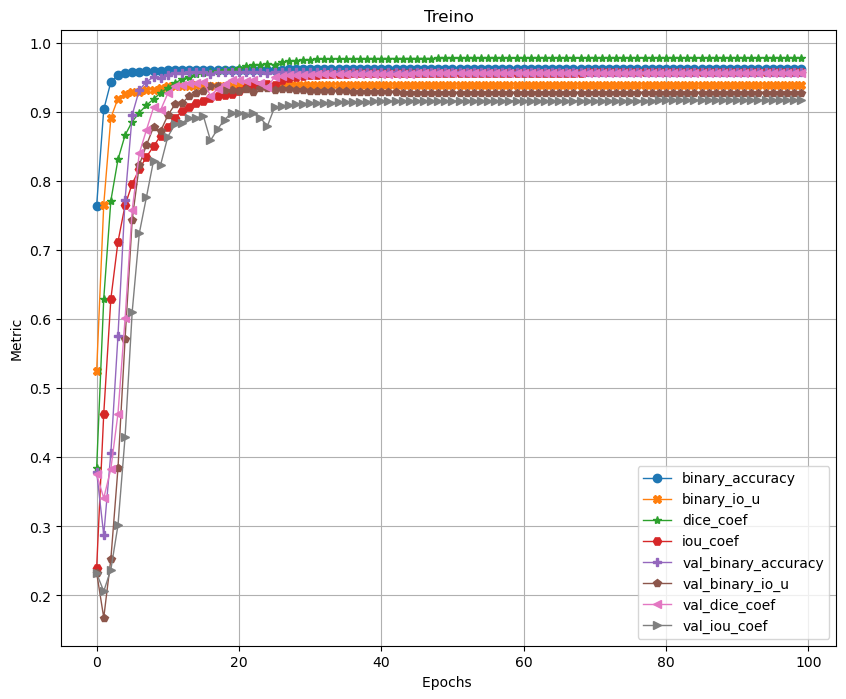

In [12]:
plot_cnn_metrics(model_history)

In [13]:
from keras.models import load_model

In [14]:
model = load_model("unet_model.h5", custom_objects={
    "dice_coef": dice_coef,
    "iou_coef": iou_coef
})

In [15]:
loss, binary_accuracy, binary_io_u, dice_coef, iou_coef = model.evaluate(X_test, y_test)

1/1 [==============================] - 1s 1s/step - loss: 0.0344 - binary_accuracy: 0.9583 - binary_io_u: 0.9297 - dice_coef: 0.9494 - iou_coef: 0.9037


In [16]:
print("Qtd train files: ", len(X_train))

Qtd train files:  70


In [17]:
print("Qtd train files: ", len(X_test))

Qtd train files:  30


In [18]:
print("Loss:", loss)
print("Accuracy:", binary_accuracy)
print("Binary IoU:", binary_io_u)
print("Dice:", dice_coef)
print("IoU:", iou_coef)

Loss: 0.03439492732286453
Accuracy: 0.9583074450492859
Binary IoU: 0.9297319650650024
Dice: 0.9494401216506958
IoU: 0.903747022151947


In [19]:
y_pred = model.predict(X_test)
y_pred_thresholded = y_pred >= 0.5

1/1 [==============================] - 1s 1s/step


In [20]:
iou = MeanIoU(num_classes=2)  

iou.update_state(y_pred_thresholded, y_test)

print("Mean IoU =", iou.result().numpy())

Mean IoU = 0.92973197


## Conjunto de Teste / Previsões

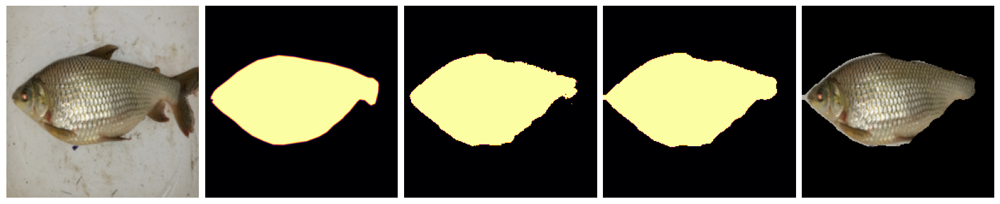

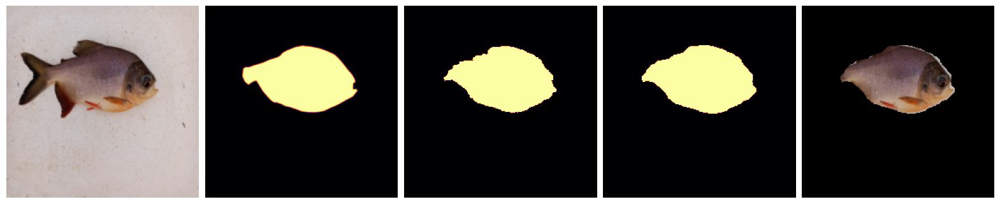

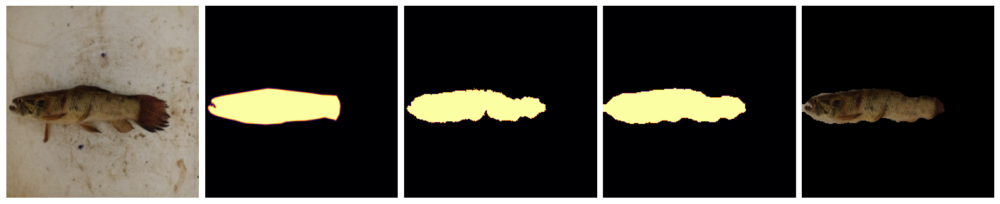

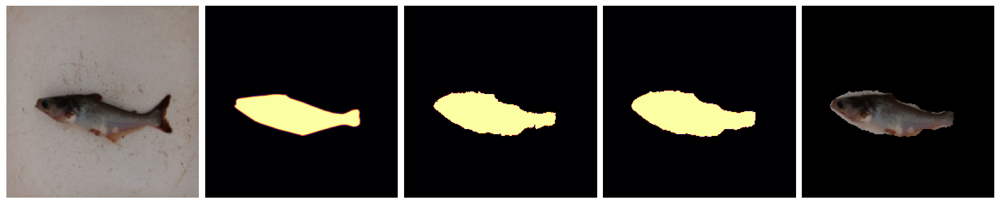

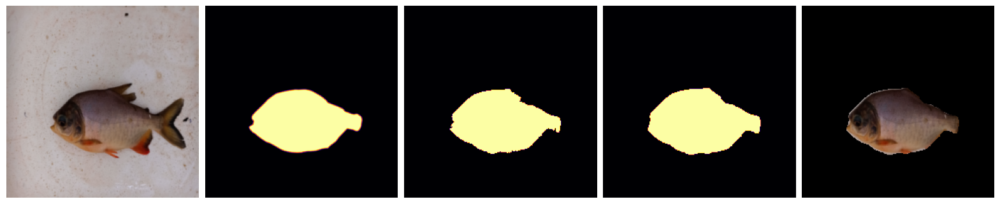

...

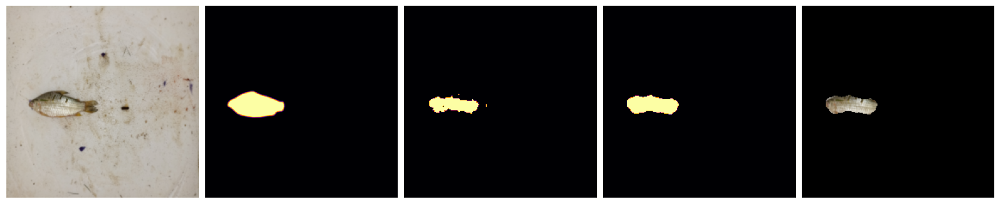

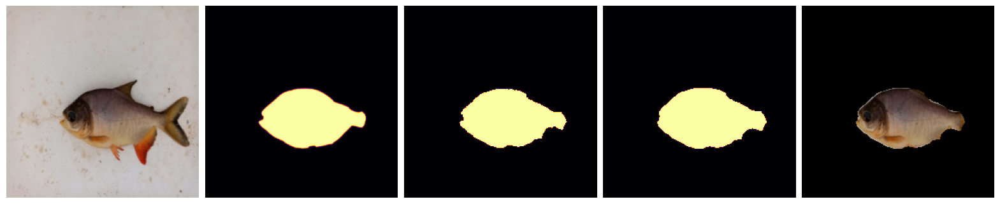

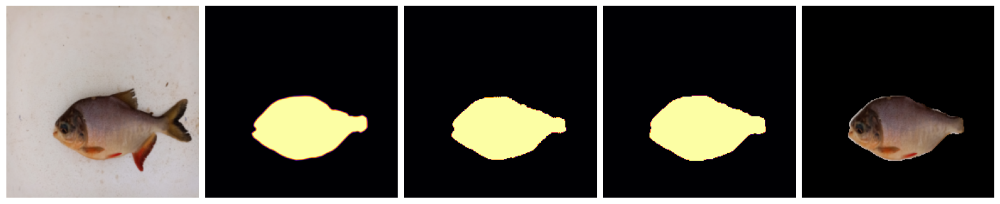

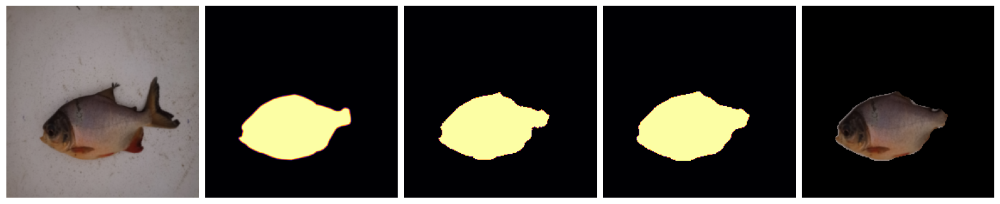

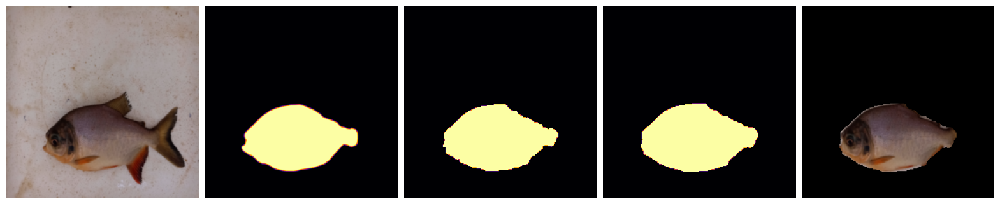

In [21]:
for index in range(len(y_pred)):
    
    predict_mask = y_pred_thresholded[index][:, :, 0].astype('uint8')
    original_mask = y_test[index]
    
    mask_smoothed = smoothing_mask(predict_mask)
    
    image = X_test[index]
    
    merged = merge_image_mask(image, mask_smoothed)
    
    plot([image, 
          original_mask,
          predict_mask,
          mask_smoothed,
          merged], (1, 5))

## Mostrando o conjunto de Treino

3/3 [==============================] - 1s 340ms/step


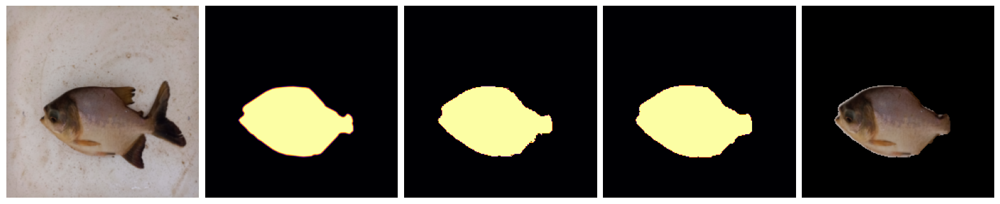

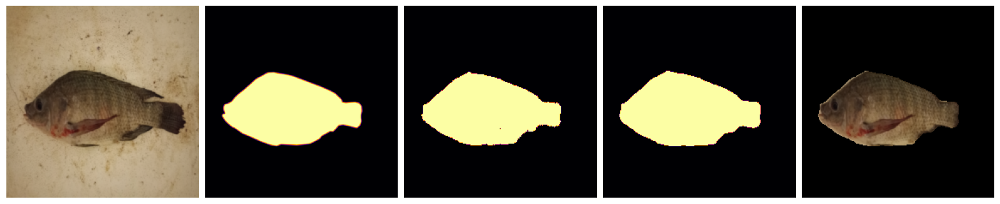

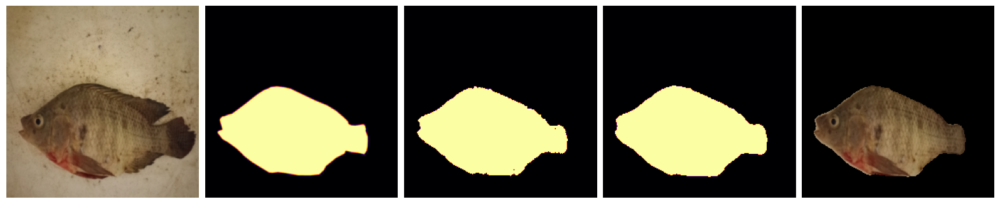

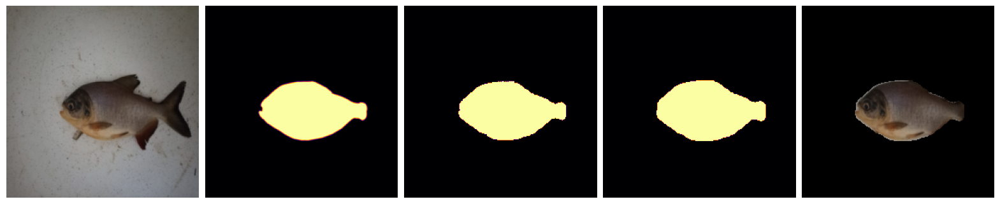

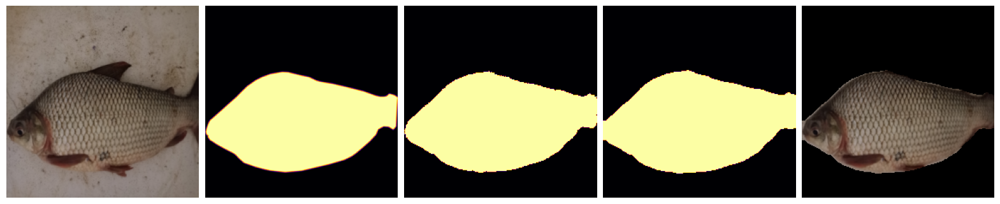

...

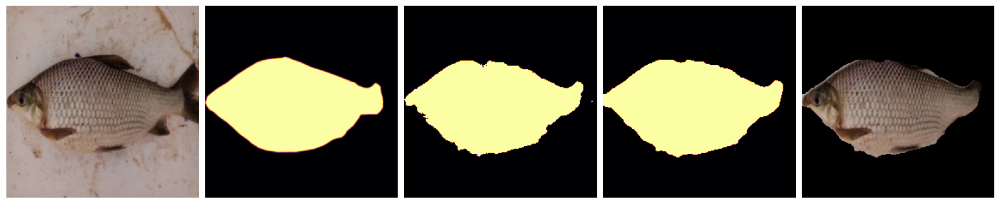

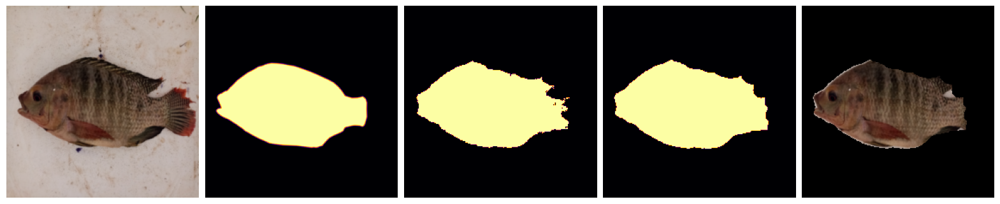

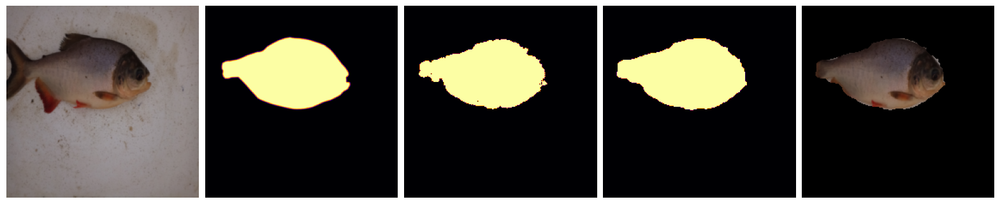

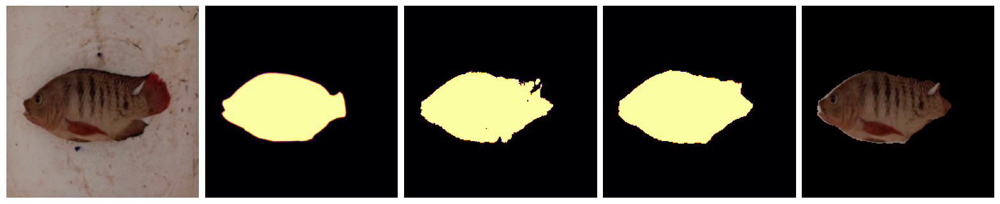

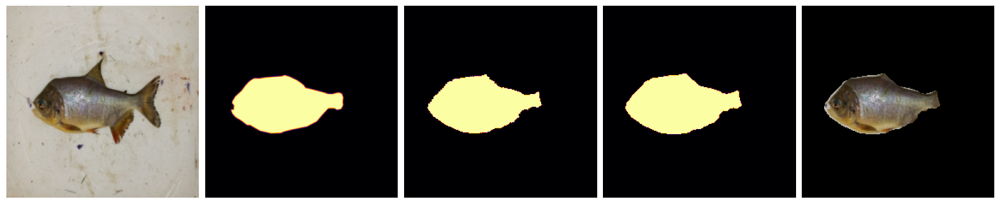

In [22]:
y_pred = model.predict(X_train)
y_pred_thresholded = y_pred >= 0.5

for index in range(len(y_pred)):
    
    predict_mask = y_pred_thresholded[index][:, :, 0].astype('uint8')
    original_mask = y_train[index]
    
    mask_smoothed = smoothing_mask(predict_mask)
    
    image = X_train[index]
    
    merged = merge_image_mask(image, mask_smoothed)
    
    plot([image, 
          original_mask,
          predict_mask,
          mask_smoothed,
          merged], (1, 5))